# Movie Remakes Graph Analysis

### Jade Webb

### Oct 2023

## Imports

In [ ]:
import networkx as nx
from networkx.algorithms import bipartite
import matplotlib.pyplot as plt
from pathlib import Path
import pandas as pd
import numpy as np
import statistics
import tensorflow as tf
import stellargraph as sg
from stellargraph import StellarGraph
from stellargraph.data import EdgeSplitter
from gensim.models import Word2Vec
from sklearn.manifold import TSNE
from sklearn.model_selection import train_test_split
import multiprocessing
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegressionCV
from sklearn.metrics import roc_auc_score
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

In [ ]:
pip install decorator==5.0.9

Note: you may need to restart the kernel to use updated packages.Requirement already satisfied: decorator==5.0.9 in c:\users\jwebb\anaconda3\envs\tensorflow\lib\site-packages (5.0.9)



## Load Movie Remakes Dataset

In [ ]:
nodes = pd.read_csv('remakes_nodes.csv', encoding = "ISO-8859-1", delimiter=';')

In [ ]:
edges = pd.read_csv('remakes_edges.csv', encoding = "ISO-8859-1", delimiter=';')

## Movies Graph

 Create a movie graph, where nodes are the movies and edges connect movies done by the same director.

In [ ]:
G_mov = nx.Graph()

In [ ]:
#add movie nodes
for row in edges.iterrows():
  G_mov.add_node(row[1].title_original)
  G_mov.add_node(row[1].title_remake)

In [ ]:
#add edge if movies have the same director
for row1 in edges.iterrows():
  for row2 in edges.iterrows():
    if(row1[0] != row2[0]):
      if(row1[1].director_original == row2[1].director_original):
        G_mov.add_edge(row1[1].title_original, row2[1].title_original)
      if(row1[1].director_original == row2[1].director_remake):
        G_mov.add_edge(row1[1].title_original, row2[1].title_remake)
      if(row1[1].director_remake == row2[1].director_original):
        G_mov.add_edge(row1[1].title_remake, row2[1].title_original)
      if(row1[1].director_remake == row2[1].director_remake):
        G_mov.add_edge(row1[1].title_remake, row2[1].title_remake)

C:\Users\jwebb\anaconda3\envs\tensorflow\lib\site-packages\IPython\core\events.py:89: UserWarning: Glyph 150 (\x96) missing from current font.
  func(*args, **kwargs)
C:\Users\jwebb\anaconda3\envs\tensorflow\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 150 (\x96) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


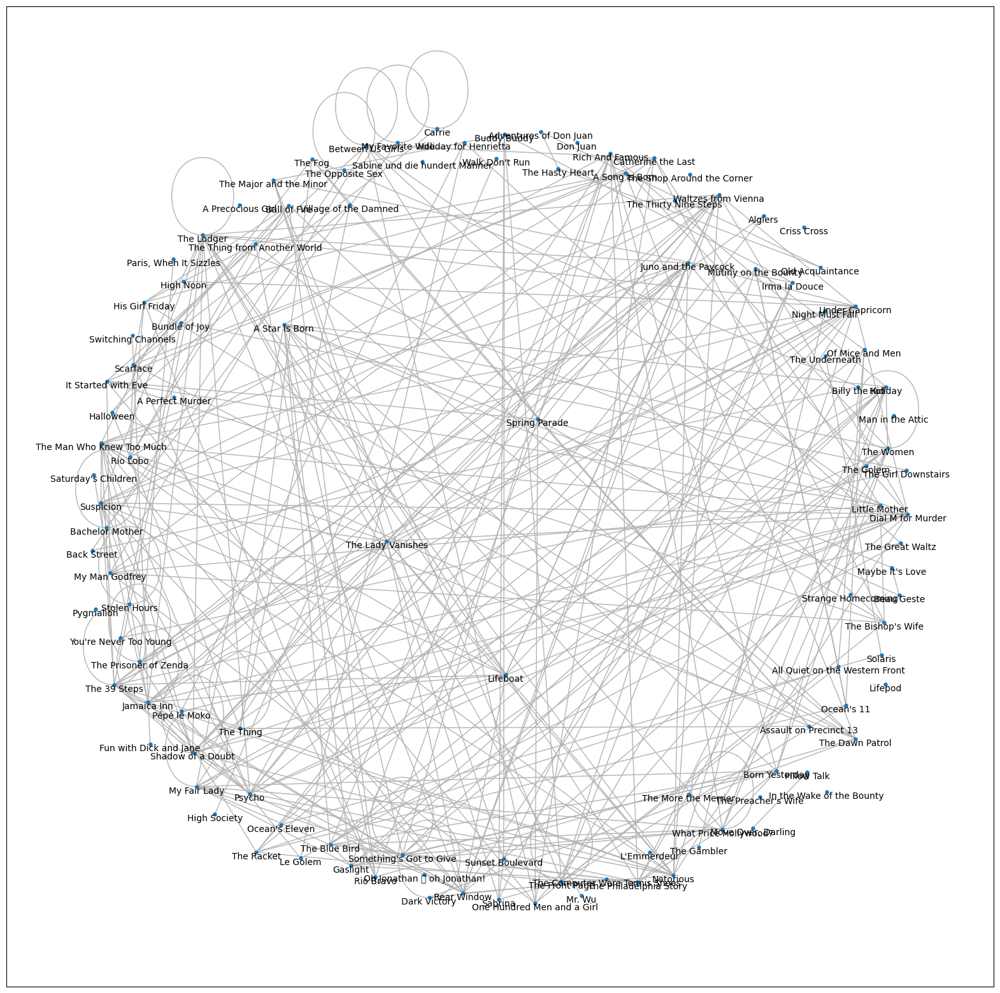

In [ ]:
plt.figure(1, figsize=(20,20))
nx.draw_networkx(G_mov, pos=nx.spring_layout(G_mov, k=2.5), node_size=13, verticalalignment="top", edge_color="#b3b3b3", alpha=1, font_size=10)

### Computations

In [ ]:
print("Number of nodes:", G_mov.number_of_nodes())

Number of nodes: 113


In [ ]:
print("Number of edges:", G_mov.number_of_edges())

Number of edges: 309


In [ ]:
degrees = nx.degree_centrality(G_mov)
print("Max degree:", max(degrees, key=degrees.get), max(degrees.values()))

Max degree: The Lodger 0.15178571428571427


In [ ]:
degrees = nx.degree_centrality(G_mov)
print("Min degree:", min(degrees, key=degrees.get), min(degrees.values()))

Min degree: Don Juan 0.0


In [ ]:
degrees = nx.degree_centrality(G_mov)
print("Avg degree:", statistics.mean(degrees.values()))

Avg degree: 0.048830594184576484


In [ ]:
print("Size of largest connected component:", len(max(nx.connected_components(G_mov), key=len)))

Size of largest connected component: 17


In [ ]:
print("Number of connected components:", nx.number_connected_components(G_mov))

Number of connected components: 33


In [ ]:
print("Assortativity:", nx.degree_assortativity_coefficient(G_mov))

Assortativity: 0.8558257303720732


In [ ]:
print("Average clustering coefficient:", nx.average_clustering(G_mov))

Average clustering coefficient: 0.6567718908426871


## Directors Graph

Create a directors graph, where nodes are the directors and edges connect directors having a movie in the same decade (e.g. 1980-1989).

In [ ]:
G_dir = nx.Graph()

In [ ]:
nodes = nodes.rename(columns={'name':'director_name'})

In [ ]:
#add director nodes
for row in nodes.iterrows():
  G_dir.add_node(row[1].id, name=row[1].director_name)

In [ ]:
#add edge if directors have a movie in the same decade
for row1 in edges.iterrows():
  for row2 in edges.iterrows():
    if(str(row1[1].year_original)[0] == str(row2[1].year_original)[0]):
      if(str(row1[1].year_original)[2] == str(row2[1].year_original)[2]):
        if(row1[0] != row2[0]):
          G_dir.add_edge(row1[1].director_original, row2[1].director_original)
    if(str(row1[1].year_original)[0] == str(row2[1].year_remake)[0]):
      if(str(row1[1].year_original)[2] == str(row2[1].year_remake)[2]):
        G_dir.add_edge(row1[1].director_original, row2[1].director_remake)
    if(str(row1[1].year_remake)[0] == str(row2[1].year_original)[0]):
      if(str(row1[1].year_remake)[2] == str(row2[1].year_original)[2]):
        G_dir.add_edge(row1[1].director_remake, row2[1].director_original)
    if(str(row1[1].year_remake)[0] == str(row2[1].year_remake)[0]):
      if(str(row1[1].year_remake)[2] == str(row2[1].year_remake)[2]):
        if(row1[0] != row2[0]):
          G_dir.add_edge(row1[1].director_remake, row2[1].director_remake)

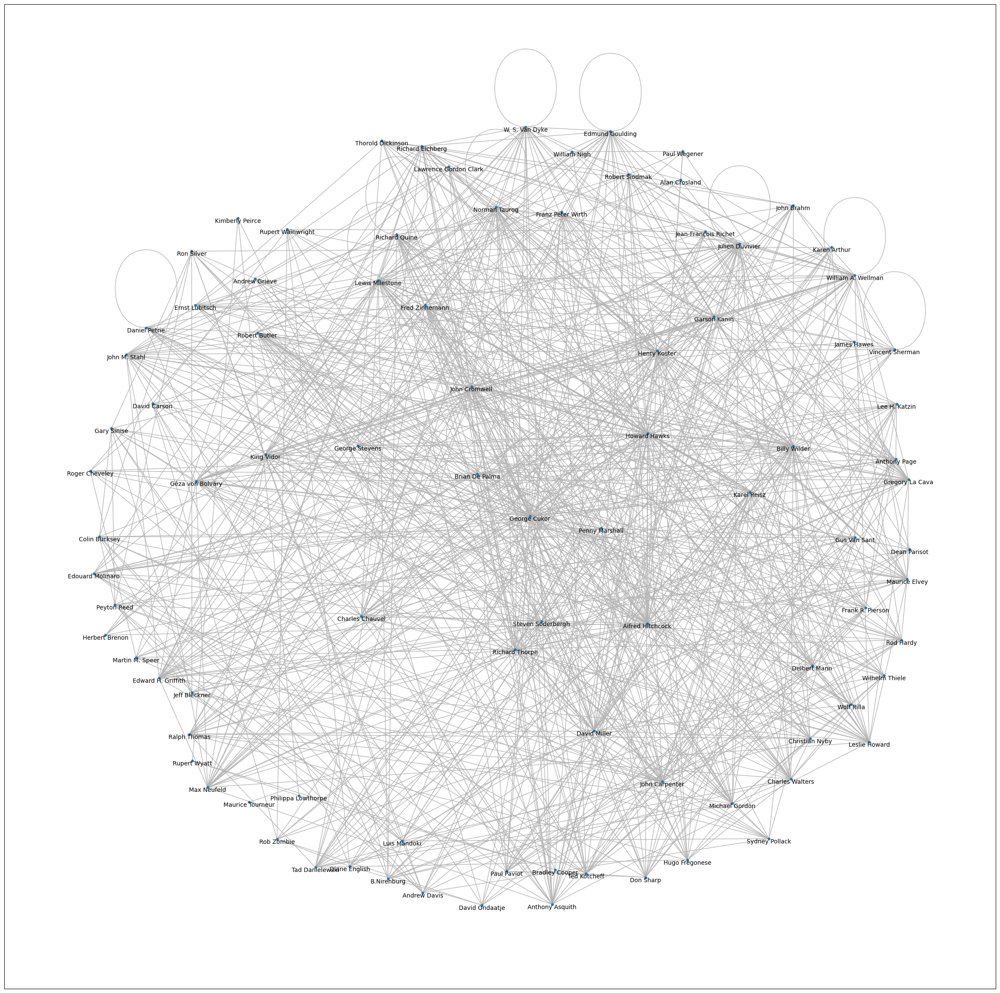

In [ ]:
plt.figure(1, figsize=(30,30))
nx.draw_networkx(G_dir, pos=nx.spring_layout(G_dir, k=2.5, scale=5), node_size=13, labels=nx.get_node_attributes(G_dir, 'name'), verticalalignment="top", edge_color="#b3b3b3", alpha=1, font_size=10)

###Computations

In [ ]:
print("Number of nodes:", G_dir.number_of_nodes())

Number of nodes: 91


In [ ]:
print("Number of edges:", G_dir.number_of_edges())

Number of edges: 853


In [ ]:
degrees = nx.degree_centrality(G_dir)
#get name of director with the max degree
for row in nodes.iterrows():
    if(row[1].id == max(degrees, key=degrees.get)):
      max_degree_name = row[1].director_name
print("Max degree:", max_degree_name, max(degrees.values()))

Max degree: George Cukor 0.7000000000000001


In [ ]:
degrees = nx.degree_centrality(G_dir)
#get name of director with the min degree
for row in nodes.iterrows():
    if(row[1].id == min(degrees, key=degrees.get)):
      min_degree_name = row[1].director_name
print("Min degree:", min_degree_name, min(degrees.values()))

Min degree: Maurice Tourneur 0.011111111111111112


In [ ]:
degrees = nx.degree_centrality(G_dir)
print("Avg degree:", statistics.mean(degrees.values()))

Avg degree: 0.2083028083028083


In [ ]:
print("Size of largest connected component:", len(max(nx.connected_components(G_dir), key=len)))

Size of largest connected component: 87


In [ ]:
print("Number of connected components:", nx.number_connected_components(G_dir))

Number of connected components: 2


In [ ]:
print("Assortativity:", nx.degree_assortativity_coefficient(G_dir))

Assortativity: 0.05181283554220134


In [ ]:
print("Average clustering coefficient:", nx.average_clustering(G_dir))

Average clustering coefficient: 0.8839171456156508


## Bipartite Graph

 Create an affiliation (bipartite) graph. The foci are the movies (one for both the original and the remake) and the people are the directors. Connect directors to movies they directed.

In [ ]:
G_bi = nx.Graph()

In [ ]:
#add movie nodes
for row in edges.iterrows():
  G_bi.add_node(row[1].title_original, name=row[1].title_original, bipartite=0)
  G_bi.add_node(row[1].title_remake, name=row[1].title_remake, bipartite=0)

In [ ]:
#add director nodes
for row in nodes.iterrows():
  G_bi.add_node(row[1].id, name=row[1].director_name, bipartite=1)

In [ ]:
#add edge if director made movie
for row in edges.iterrows():
  G_bi.add_edge(row[1].director_original, row[1].title_original)
  G_bi.add_edge(row[1].director_remake, row[1].title_remake)

In [ ]:
#get list of director names
directors_list = []
for row in nodes.iterrows():
  directors_list.append(row[1].id)

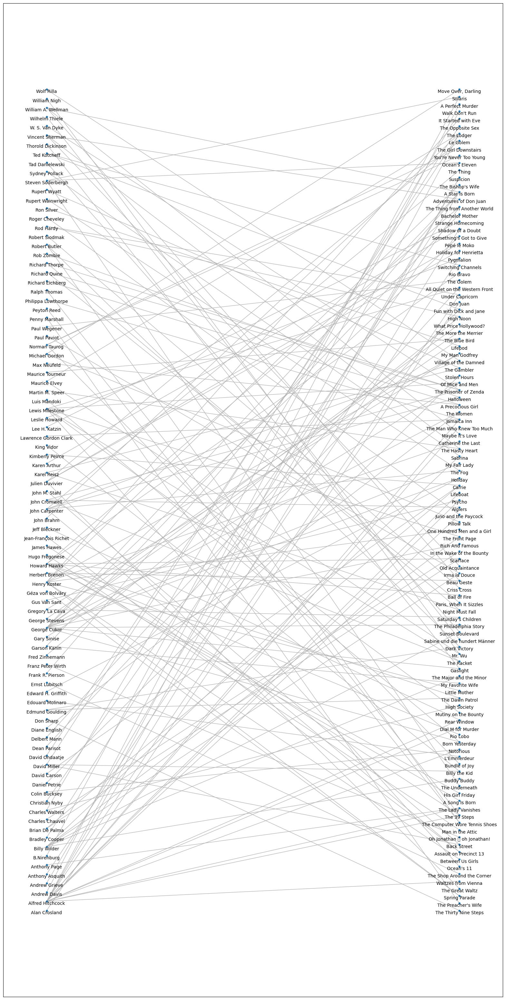

In [ ]:
plt.figure(1, figsize=(20,40))
nx.draw_networkx(G_bi, pos=nx.bipartite_layout(G_bi, directors_list, scale=5), node_size=13, labels=nx.get_node_attributes(G_bi, 'name'), verticalalignment="top", edge_color="#b3b3b3", alpha=1, font_size=10)

###Computations

In [ ]:
print("Number of nodes:", G_bi.number_of_nodes())

Number of nodes: 204


In [ ]:
print("Number of edges:", G_bi.number_of_edges())

Number of edges: 171


## Projected Graph

Create the projected graph of (c). Two directors are connected if they direct the same movie.

In [ ]:
G_proj = nx.Graph()

In [ ]:
G_proj = bipartite.projected_graph(G_bi, directors_list)

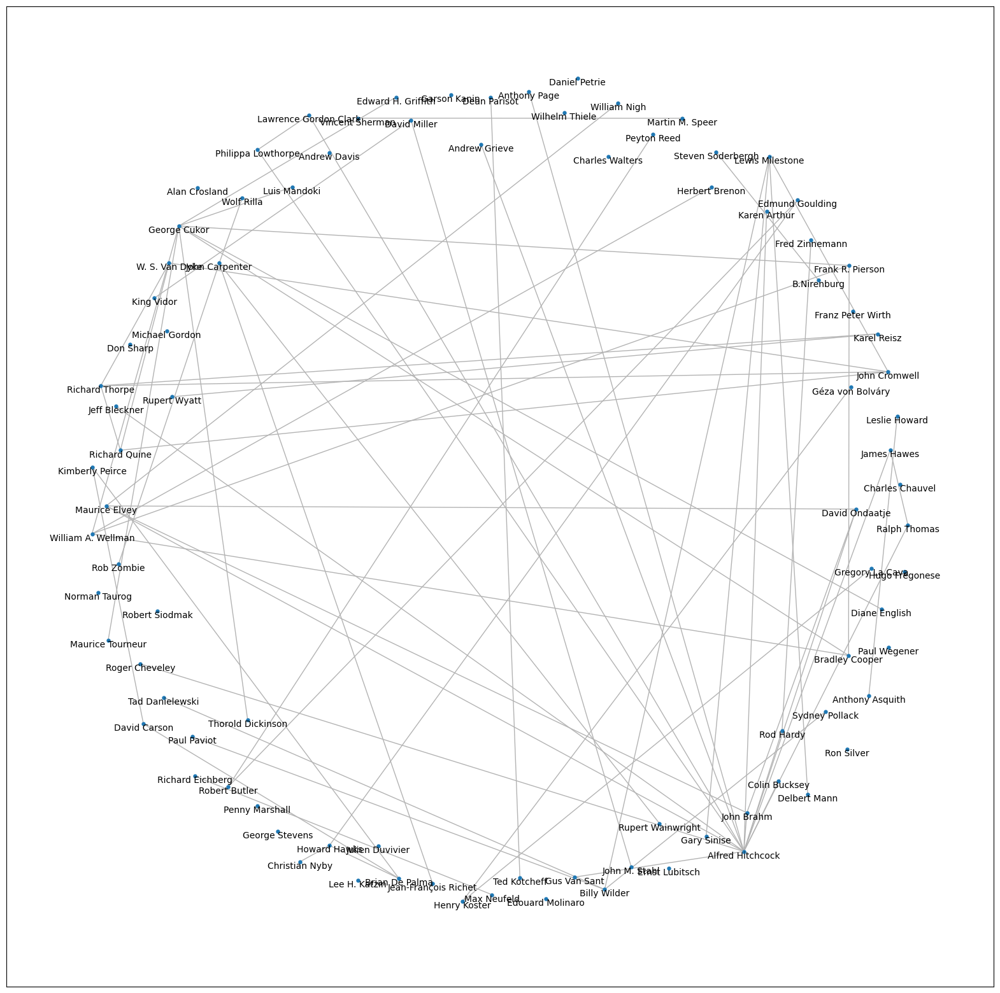

In [ ]:
plt.figure(1, figsize=(20,20))
nx.draw_networkx(G_proj, pos=nx.spring_layout(G_proj, k=2.5), node_size=13, labels=nx.get_node_attributes(G_dir, 'name'), verticalalignment="top", edge_color="#b3b3b3", alpha=1, font_size=10)

###Computations

In [ ]:
print("Number of nodes:", G_proj.number_of_nodes())

Number of nodes: 91


In [ ]:
print("Number of edges:", G_proj.number_of_edges())

Number of edges: 70


####Degree Centralities

In [ ]:
degrees = nx.degree_centrality(G_proj)

In [ ]:
sorted_degrees = sorted(degrees, key=degrees.get)
sorted_degrees.reverse()

In [ ]:
top5_degree = sorted_degrees[:5]

In [ ]:
top5_degree_names = []
for item in top5_degree:
  for row in nodes.iterrows():
    if(row[1].id == item):
      top5_degree_names.append(row[1].director_name)

In [ ]:
print("Top 5 nodes with highest degree centrality:", top5_degree_names)

Top 5 nodes with highest degree centrality: ['Alfred Hitchcock', 'George Cukor', 'William A. Wellman', 'Richard Thorpe', 'Maurice Elvey']


####Closeness Centralities

In [ ]:
closeness = nx.closeness_centrality(G_proj)

In [ ]:
sorted_closeness = sorted(closeness, key=closeness.get)
sorted_closeness.reverse()

In [ ]:
top5_closeness = sorted_closeness[:5]

In [ ]:
top5_closeness_names = []
for item in top5_closeness:
  for row in nodes.iterrows():
    if(row[1].id == item):
      top5_closeness_names.append(row[1].director_name)

In [ ]:
print("Top 5 nodes with highest closeness centrality:", top5_closeness_names)

Top 5 nodes with highest closeness centrality: ['Alfred Hitchcock', 'Maurice Elvey', 'John Brahm', 'David Ondaatje', 'Rod Hardy']


####Betweenness Centralities

In [ ]:
betweenness = nx.betweenness_centrality(G_proj)

In [ ]:
sorted_betweenness = sorted(betweenness, key=betweenness.get)
sorted_betweenness.reverse()

In [ ]:
top5_betweenness = sorted_betweenness[:5]

In [ ]:
top5_betweenness_names = []
for item in top5_betweenness:
  for row in nodes.iterrows():
    if(row[1].id == item):
      top5_betweenness_names.append(row[1].director_name)

In [ ]:
print("Top 5 nodes with highest betweenness centrality:", top5_betweenness_names)

Top 5 nodes with highest betweenness centrality: ['Alfred Hitchcock', 'Lewis Milestone', 'John Cromwell', 'George Cukor', 'Billy Wilder']


####Eigenvector Centralities

In [ ]:
eigenvector = nx.eigenvector_centrality(G_proj)

In [ ]:
sorted_eigenvector = sorted(eigenvector, key=eigenvector.get)
sorted_eigenvector.reverse()

In [ ]:
top5_eigenvector = sorted_eigenvector[:5]

In [ ]:
top5_eigenvector_names = []
for item in top5_eigenvector:
  for row in nodes.iterrows():
    if(row[1].id == item):
      top5_eigenvector_names.append(row[1].director_name)

In [ ]:
print("Top 5 nodes with highest eigenvector centrality:", top5_eigenvector_names)

Top 5 nodes with highest eigenvector centrality: ['Alfred Hitchcock', 'Maurice Elvey', 'John Brahm', 'David Ondaatje', 'Ralph Thomas']


####Katz Centralities

In [ ]:
katz = nx.katz_centrality(G_proj)

In [ ]:
sorted_katz = sorted(katz, key=katz.get)
sorted_katz.reverse()

In [ ]:
top5_katz = sorted_katz[:5]

In [ ]:
top5_katz_names = []
for item in top5_katz:
  for row in nodes.iterrows():
    if(row[1].id == item):
      top5_katz_names.append(row[1].director_name)

In [ ]:
print("Top 5 nodes with highest katz centrality:", top5_katz_names)

Top 5 nodes with highest katz centrality: ['Alfred Hitchcock', 'George Cukor', 'Maurice Elvey', 'John Brahm', 'David Ondaatje']


## node2vec Embeddings

Use node2vec to get the node embeddings of (d) and draw them on the 2D space.

Reference: https://colab.research.google.com/github/stellargraph/stellargraph/blob/master/demos/embeddings/node2vec-embeddings.ipynb

In [ ]:
try:
    sg.utils.validate_notebook_version("1.2.1")
except AttributeError:
    raise ValueError(
        f"This notebook requires StellarGraph version 1.2.1, but a different version {sg.__version__} is installed.  Please see <https://github.com/stellargraph/stellargraph/issues/1172>."
    ) from None

In [ ]:
#transform networkx graph from (d) to a stellargraph
G_proj_stellar = StellarGraph.from_networkx(G_proj)

In [ ]:
from stellargraph.data import BiasedRandomWalk

rw = BiasedRandomWalk(G_proj_stellar)

#perform 10 random walks per node
walks = rw.run(
    nodes=list(G_proj_stellar.nodes()),
    length=30,
    n=10,
    p=0.5,
    q=2.0
)
print("Number of random walks:", len(walks))

Number of random walks: 910


In [ ]:
#use word2vec to get embeddings fo each node
str_walks = [[str(n) for n in walk] for walk in walks]
model = Word2Vec(str_walks, vector_size=128, window=5, min_count=0, sg=1, workers=2)

In [ ]:
#dimensionality of each embedding is 128
model.wv["1"].shape

(128,)

In [ ]:
#get node embeddings
node_ids = model.wv.index_to_key
node_embeddings = (
    model.wv.vectors
)

In [ ]:
#transform embeddings into a 2D space using TSNE
transform = TSNE
trans = transform(n_components=2)
node_embeddings_2d = trans.fit_transform(node_embeddings)

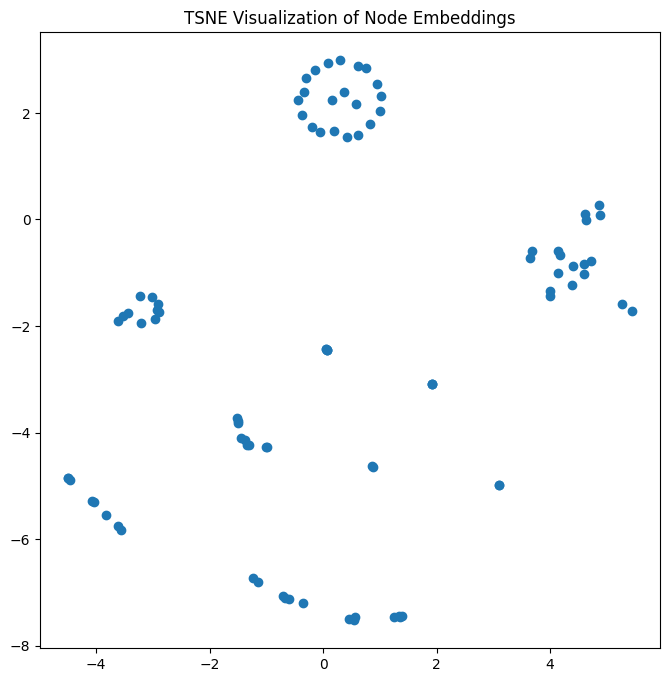

In [ ]:
#visualize embeddings in a 2D space
plt.figure(figsize=(8, 8))
plt.scatter(
    node_embeddings_2d[:, 0],
    node_embeddings_2d[:, 1],
    alpha=1,
)
plt.title("TSNE Visualization of Node Embeddings")
plt.show()

## ML Problem: Link Prediction

Based on the projected graph, predict which directors are likely to have directed the same movie.

Reference: https://colab.research.google.com/github/stellargraph/stellargraph/blob/v1.2.0/demos/link-prediction/node2vec-link-prediction.ipynb

In [ ]:
edge_splitter_test = EdgeSplitter(G_proj_stellar)

In [ ]:
#remove a small set of links to obtain a test graph
graph_test, examples_test, labels_test = edge_splitter_test.train_test_split(
    p=0.2, method="global"
)
print(graph_test.info())

** Sampled 14 positive and 14 negative edges. **
StellarGraph: Undirected multigraph
 Nodes: 91, Edges: 56

 Node types:
  default: [91]
    Features: none
    Edge types: default-default->default

 Edge types:
    default-default->default: [56]
        Weights: all 1 (default)
        Features: none


In [ ]:
edge_splitter_train = EdgeSplitter(graph_test, G_proj_stellar)

In [ ]:
#remove a small set of links to obtain a train graph
#divide into training and testing sets (70% - 30% split)
graph_train, examples, labels = edge_splitter_train.train_test_split(
    p=0.2, method="global"
)
(
    examples_train,
    examples_model_selection,
    labels_train,
    labels_model_selection,
) = train_test_split(examples, labels, train_size=0.7, test_size=0.3)

print(graph_train.info())

** Sampled 11 positive and 11 negative edges. **
StellarGraph: Undirected multigraph
 Nodes: 91, Edges: 45

 Node types:
  default: [91]
    Features: none
    Edge types: default-default->default

 Edge types:
    default-default->default: [45]
        Weights: all 1 (default)
        Features: none


In [ ]:
p = 0.5
q = 2.0
dimensions = 128
num_walks = 20
walk_length = 50
window_size = 5
num_iter = 1
workers = multiprocessing.cpu_count()

In [ ]:
#helper functions to get a node embedding by performing random walks
def node2vec_embedding(graph, name):
    rw = BiasedRandomWalk(graph)
    walks = rw.run(graph.nodes(), n=num_walks, length=walk_length, p=p, q=q)
    print(f"Number of random walks for '{name}': {len(walks)}")

    model = Word2Vec(
        walks,
        vector_size=dimensions,
        window=window_size,
        min_count=0,
        sg=1,
        workers=workers,
    )

    def get_embedding(u):
        return model.wv[u]

    return get_embedding

In [ ]:
#get node embeddings for the train graph
embedding_train = node2vec_embedding(graph_train, "Train Graph")

Number of random walks for 'Train Graph': 1820


In [ ]:
#helper function to embed links
def link_examples_to_features(link_examples, transform_node, binary_operator):
    return [
        binary_operator(transform_node(src), transform_node(dst))
        for src, dst in link_examples
    ]

#helper function to train link prediction classifier
def train_link_prediction_model(
    link_examples, link_labels, get_embedding, binary_operator
):
    clf = link_prediction_classifier()
    link_features = link_examples_to_features(
        link_examples, get_embedding, binary_operator
    )
    clf.fit(link_features, link_labels)
    return clf

#helper function to define logistic regression classifier
def link_prediction_classifier(max_iter=2000):
    lr_clf = LogisticRegressionCV(Cs=5, cv=5, scoring="roc_auc", max_iter=max_iter)
    return Pipeline(steps=[("sc", StandardScaler()), ("clf", lr_clf)])

#helper function to evaluate classifier
def evaluate_link_prediction_model(
    clf, link_examples_test, link_labels_test, get_embedding, binary_operator
):
    link_features_test = link_examples_to_features(
        link_examples_test, get_embedding, binary_operator
    )
    score = evaluate_roc_auc(clf, link_features_test, link_labels_test)
    return score

#helper function to get ROC AUC score
def evaluate_roc_auc(clf, link_features, link_labels):
    predicted = clf.predict_proba(link_features)
    positive_column = list(clf.classes_).index(1)
    return roc_auc_score(link_labels, predicted[:, positive_column])

In [ ]:
#helper functions for each link embedding operator
def operator_hadamard(u, v):
    return u * v

def operator_l1(u, v):
    return np.abs(u - v)

def operator_l2(u, v):
    return (u - v) ** 2

def operator_avg(u, v):
    return (u + v) / 2.0

#helper function to predict link based on a binary operator
def run_link_prediction(binary_operator):
    clf = train_link_prediction_model(
        examples_train, labels_train, embedding_train, binary_operator
    )
    score = evaluate_link_prediction_model(
        clf,
        examples_model_selection,
        labels_model_selection,
        embedding_train,
        binary_operator,
    )

    return {
        "classifier": clf,
        "binary_operator": binary_operator,
        "score": score,
    }

binary_operators = [operator_hadamard, operator_l1, operator_l2, operator_avg]

In [ ]:
#predict links using each operator to determine which operator yields the best result
results = [run_link_prediction(op) for op in binary_operators]
best_result = max(results, key=lambda result: result["score"])
print(f"Best result using '{best_result['binary_operator'].__name__}'")

pd.DataFrame(
    [(result["binary_operator"].__name__, result["score"]) for result in results],
    columns=("name", "ROC AUC score"),
).set_index("name")

Best result using 'operator_l1'


,ROC AUC score
name,
operator_hadamard,0.5
operator_l1,0.9
operator_l2,0.8
operator_avg,0.6


In [ ]:
#get node embeddings for the test graph
embedding_test = node2vec_embedding(graph_test, "Test Graph")

Number of random walks for 'Test Graph': 1820


In [ ]:
#predict links in the test graph using the best operator
test_score = evaluate_link_prediction_model(
    best_result["classifier"],
    examples_test,
    labels_test,
    embedding_test,
    best_result["binary_operator"],
)
print(
    f"ROC AUC score on test set using '{best_result['binary_operator'].__name__}': {test_score}"
)

ROC AUC score on test set using 'operator_l1': 0.7704081632653061


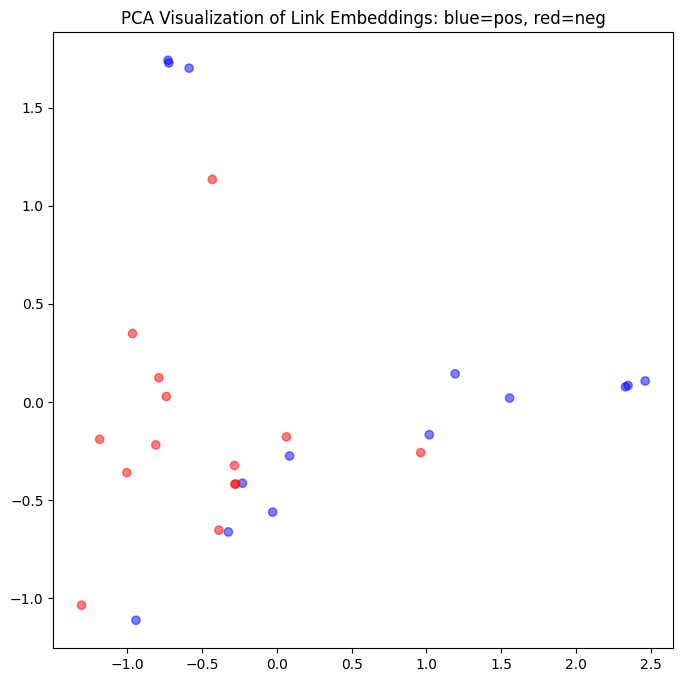

In [ ]:
#get link features for test samples
link_features = link_examples_to_features(
    examples_test, embedding_test, best_result["binary_operator"]
)

#use PCA to project the 128 dimensions to 2
pca = PCA(n_components=2)
X_transformed = pca.fit_transform(link_features)

#visualize the link embeddings
plt.figure(figsize=(8, 8))
plt.scatter(
    X_transformed[:, 0],
    X_transformed[:, 1],
    c=np.where(labels_test == 1, "b", "r"),
    alpha=0.5,
)
plt.title("PCA Visualization of Link Embeddings: blue=pos, red=neg")
plt.show()